# Initialisation

In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [108]:
# Paths to the images
imgref_path = 'Test2/image1.jpg'
img2_path = 'Test2/image2.jpg'
img3_path ='Test2/image3.jpg'

# Call the function to match images

img_ref, img2, img3 = cv2.imread(imgref_path), cv2.imread(img2_path), cv2.imread(img3_path)

In [109]:
images = [img2, img3]
images_path = [img2_path, img3_path]

In [110]:
# Function to find and draw matches between two images
def match_images(img1_path, img2_path):
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE) 
    img2 = cv2.imread(img2_path,cv2.IMREAD_GRAYSCALE)
    if img1 is None or img2 is None:
        print("Error loading images")
        return

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Perform the matching
    matches = flann.knnMatch(des1, des2, k=2)

    # Store all the good matches as per Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
    
    good_matches.sort(key=lambda x: x.distance)

    # Draw matches
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    img_matches_rgb = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)
    
    # Display the image with matches using matplotlib
    plt.figure(figsize=(20, 10))
    plt.imshow(img_matches_rgb)
    plt.axis('off')  # Hide the axis
    plt.show()
    return kp1, kp2, good_matches[:15]



In [111]:
def Jacobian(vector, transf):
    x,y = vector
    if transf == 'translation':
        return np.identity(2)
    
    if transf=='similarity':
        matrix = np.array([
        [1, 0, x, -y],
        [0, 1, y, x]])
        return matrix
    
    if transf=='affine':
        matrix = np.array([
        [1, 0, x, y, 0, 0],
        [0, 1, 0, 0, x, y]])
        return matrix

def parameters(image1, image2, transf):
    
    kp1, kp2, matches = match_images(image1, image2)
    
    Jacobian_list = []
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches])
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches])
    
    delta_pts = np.float32(dst_pts - src_pts)
    
    Jacobian_list = [Jacobian(src_pt, transf) for src_pt in src_pts]
        
    A = np.sum([Ji.T @ Ji for Ji in Jacobian_list], axis = 0)
    b = np.sum([Jacobian_list[i].T @ delta_pts[i] for i in range(len(delta_pts))], axis=0)
    return np.linalg.solve(A,b)


def matrix_transformation(image1, image2,transf):
    
    p = parameters(image1, image2, transf)
    
    if transf=='translation':
        tx, ty = p
        matrix = np.array([
        [1, 0, tx],
        [0, 1, ty],
        [0, 0, 1]])
        return matrix
    
    if transf=='similarity':
        tx, ty, a, b = p
        matrix = np.array([
        [1+a, -b, tx],
        [b, 1+a, ty],
        [0,0,1]])
        return matrix
    
    if transf=='affine':
        tx, ty, a, b, c, d = p
        matrix = np.array([
        [1+a, b, tx],
        [c, 1+d, ty],
        [0, 0, 1]])
        return matrix
    else : 
        print('error')

In [112]:
def transform_corner(image1_path, image2_path, transf):
    
    matrix = matrix_transformation(image1_path, image2_path, transf)
    
    image1 = cv2.imread(image1_path)

    height, width = len(image1), len(image1[0])
    corners = np.array([[0, 0], [width, 0], [width, height], [0, height]], dtype=np.float32).reshape(-1, 1, 2)
    transformed_corners = cv2.perspectiveTransform(corners, matrix)
    return matrix, transformed_corners

In [113]:
def create_canvas(new_coordinates, img_ref, matrices):    
    max_x = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
    max_y = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 1])
    
    min_x = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
    min_y = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 1])
    
    canvas_width, canvas_height = int(max_x-min_x), int(max_y-min_y)
    
    canvas = np.zeros((canvas_height, canvas_width,3), dtype=np.float32)
    counter = np.zeros((canvas_height, canvas_width,3), dtype=np.float32)
    translation_canvas = np.array([
            [1, 0, -min_x],
            [0, 1, -min_y],
            [0, 0, 1]])
    
    
    warped_img = cv2.warpPerspective(img_ref, translation_canvas, (canvas_width, canvas_height))
    
    canvas += warped_img.astype(np.float32)
    mask = (warped_img > 0).astype(np.float32)
    counter += mask
    
    #for k in range(len(matrices)):
    for k in range(len(matrices)):
        image = images[k]
        mat = translation_canvas @ matrices[k]
        warped_img = cv2.warpPerspective(image, mat, (canvas_width, canvas_height))
        mask = (warped_img > 0).astype(np.float32)
        canvas += warped_img.astype(np.float32)
        counter += mask
        
        
    # Convert the BGR image to RGB
    canvas =  np.divide(canvas, counter, out=np.zeros_like(canvas), where=counter != 0).astype(np.uint8)
    canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
    warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)
    return canvas

# Test Matchpoints

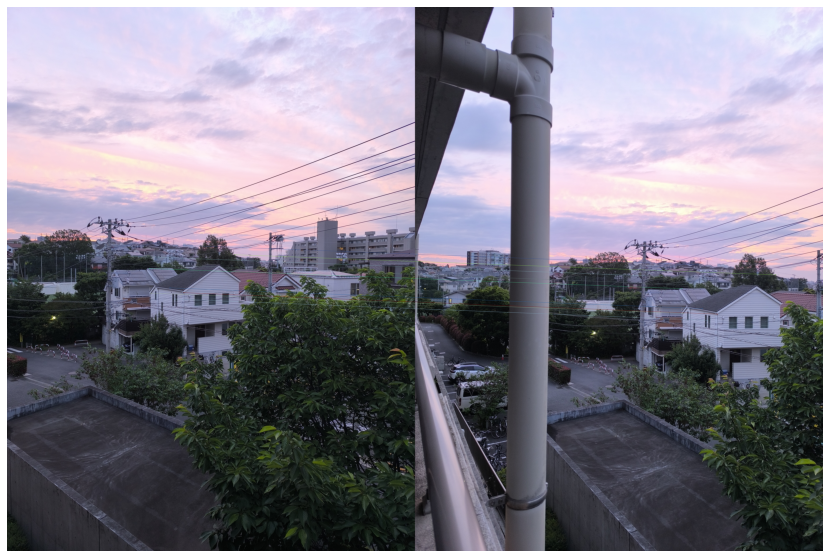

In [114]:
# Initialize SIFT detector
sift = cv2.SIFT_create()

test_ref, test2, test3 = cv2.imread(imgref_path, cv2.IMREAD_GRAYSCALE), cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE), cv2.imread(img3_path, cv2.IMREAD_GRAYSCALE)
# Find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(test_ref, None)
kp2, des2 = sift.detectAndCompute(test3, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Perform the matching
matches = flann.knnMatch(des1, des2, k=2)

# Store all the good matches as per Lowe's ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)


good_matches.sort(key=lambda x: x.distance)

# Draw matches
img_matches = cv2.drawMatches(img_ref, kp1, img3, kp2, good_matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img_matches_rgb = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

# Display the image with matches using matplotlib
plt.figure(figsize=(20, 10))
plt.imshow(img_matches_rgb)
plt.axis('off')  # Hide the axis
plt.show()



# Translation Transform

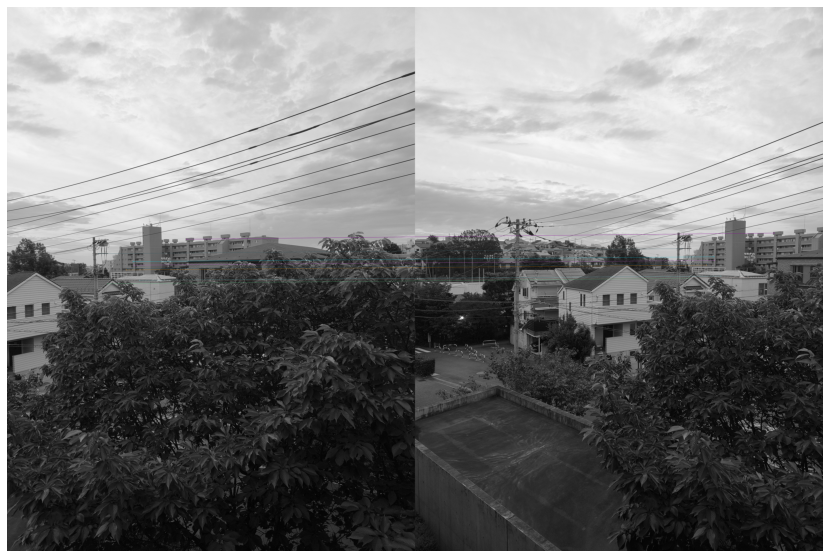

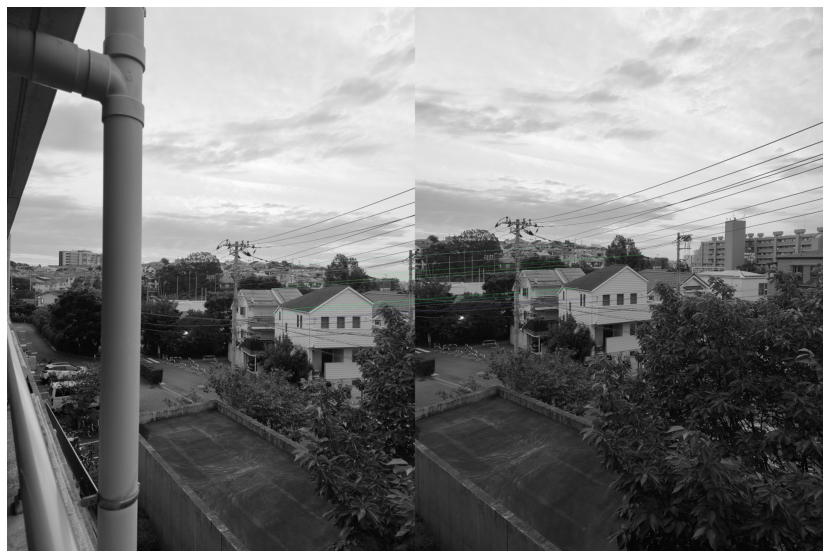

In [115]:
mc = [transform_corner(image_path, imgref_path,'translation') for image_path in images_path]
matrices, new_coordinates = [row[0] for row in mc], [row[1] for row in mc]

height_ref, width_ref = len(img_ref), len(img_ref[0])

new_coordinates.append(np.array([[0, 0], [width_ref, 0], [width_ref, height_ref], [0, height_ref]], dtype=np.float32).reshape(-1, 1, 2))




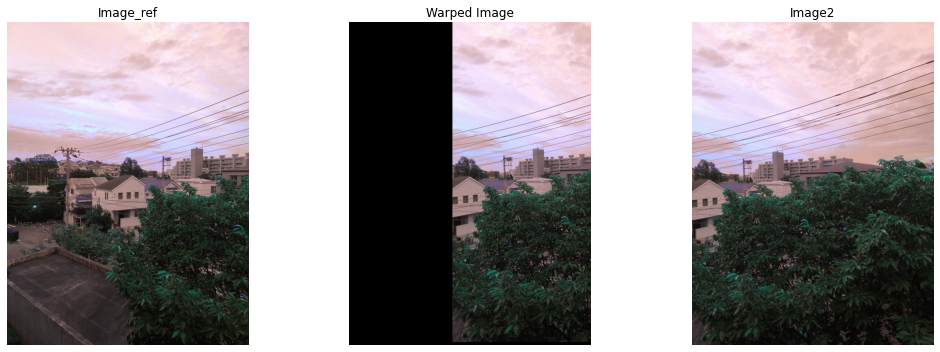

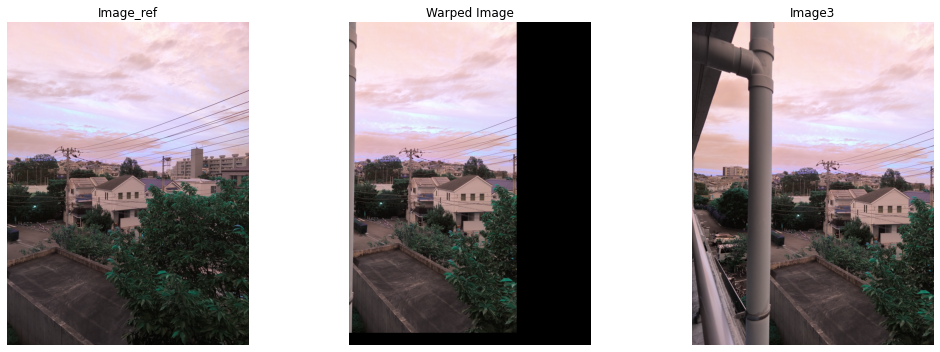

In [116]:
for k in range(len(matrices)):
    image = images[k]
    height, width = image.shape[:2]
    warped_img = cv2.warpPerspective(image, matrices[k], (width, height))

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(img_ref)
    axs[0].axis('off')
    axs[0].set_title("Image_ref")

    axs[1].imshow(warped_img)
    axs[1].axis('off')
    axs[1].set_title("Warped Image")

    axs[2].imshow(image)
    axs[2].axis('off')
    axs[2].set_title("Image"+str(k+2))

    plt.tight_layout()
    plt.show()

[[  1.           0.         938.86560059]
 [  0.           1.         153.75360107]
 [  0.           0.           1.        ]]


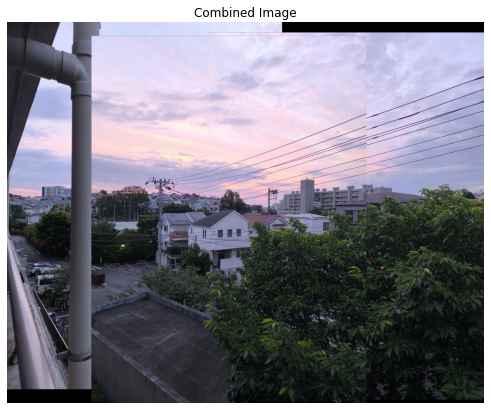

In [117]:
max_x = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
max_y = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

min_x = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
min_y = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

canvas_width, canvas_height = int(max_x-min_x), int(max_y-min_y)

canvas = np.zeros((canvas_width, canvas_height), dtype=np.uint8)

translation_canvas = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]])


warped_img = cv2.warpPerspective(img_ref, translation_canvas, (canvas_width, canvas_height))

canvas = warped_img

print(translation_canvas)

#for k in range(len(matrices)):
for k in range(len(matrices)):
    image = images[k]
    mat = translation_canvas @ matrices[k]
    warped_img = cv2.warpPerspective(image, mat, (canvas_width, canvas_height))
    gray_canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2GRAY)
    
    # Create mask where canvas is black
    mask = np.zeros_like(gray_canvas)
    mask[gray_canvas == 0] = 255
    # Invert mask
    mask_inverse = cv2.bitwise_not(mask)
    
    # Blend picture 2 into picture 1 using the mask
    canvas += cv2.bitwise_and(warped_img, warped_img, mask=mask)
    
    
# Convert the BGR image to RGB
canvas_rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)


# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_rgb)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

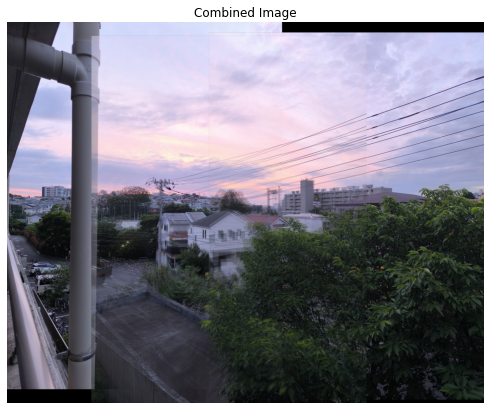

In [118]:
canvas_translation = create_canvas(new_coordinates, img_ref, matrices)

# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_translation)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

# Similarity

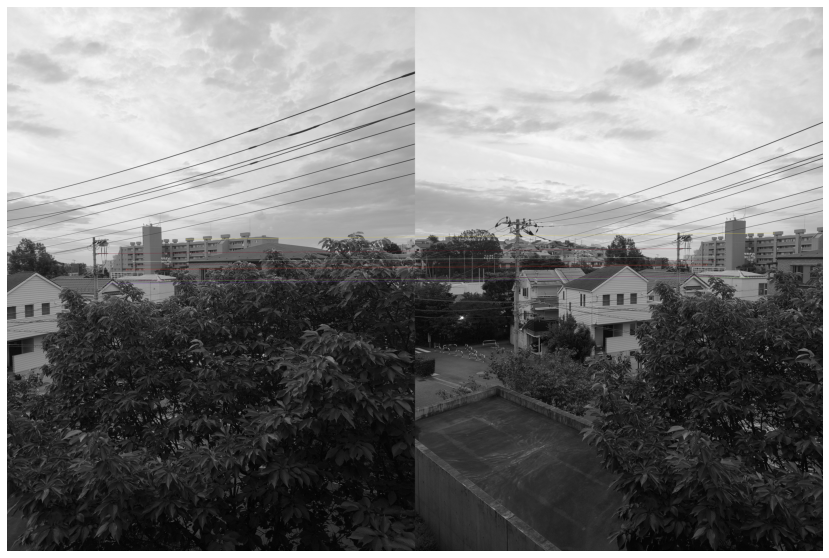

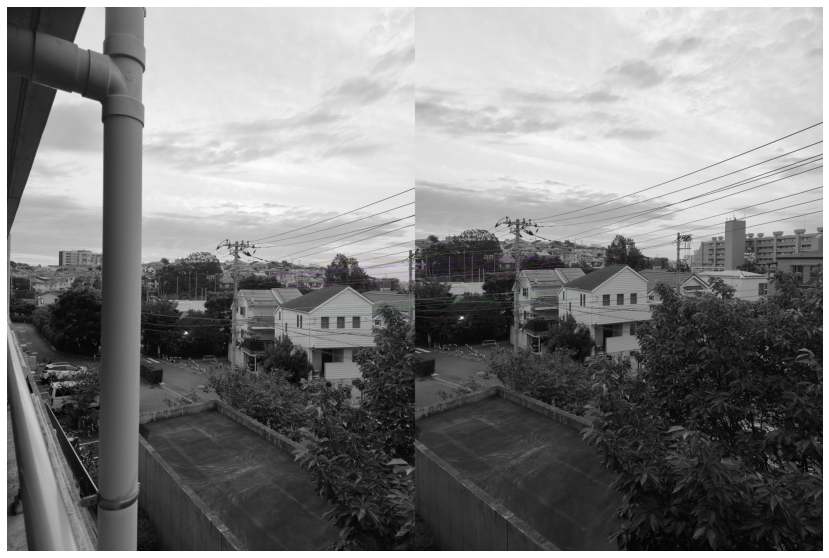

In [119]:
mc = [transform_corner(image_path, imgref_path,'similarity') for image_path in images_path]
matrices, new_coordinates = [row[0] for row in mc], [row[1] for row in mc]

height_ref, width_ref = len(img_ref), len(img_ref[0])

new_coordinates.append(np.array([[0, 0], [width_ref, 0], [width_ref, height_ref], [0, height_ref]], dtype=np.float32).reshape(-1, 1, 2))


[[ 1.05548842e+00 -2.11027853e-02  1.29465345e+03]
 [ 2.11027853e-02  1.05548842e+00 -1.65422151e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


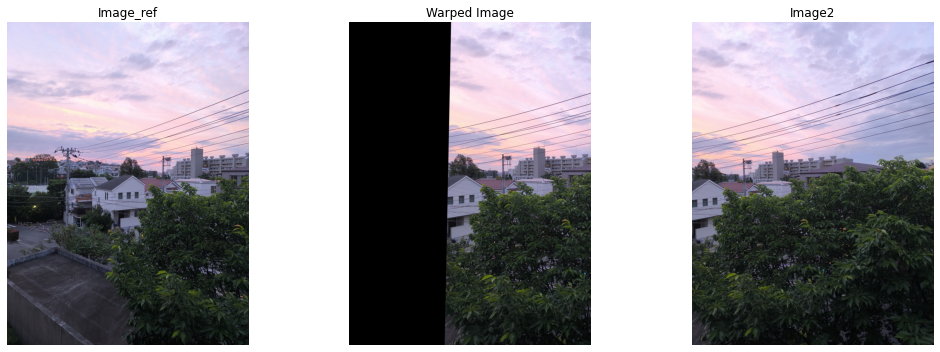

[[ 9.47415655e-01  2.15516576e-02 -8.74701841e+02]
 [-2.15516576e-02  9.47415655e-01  7.71681682e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


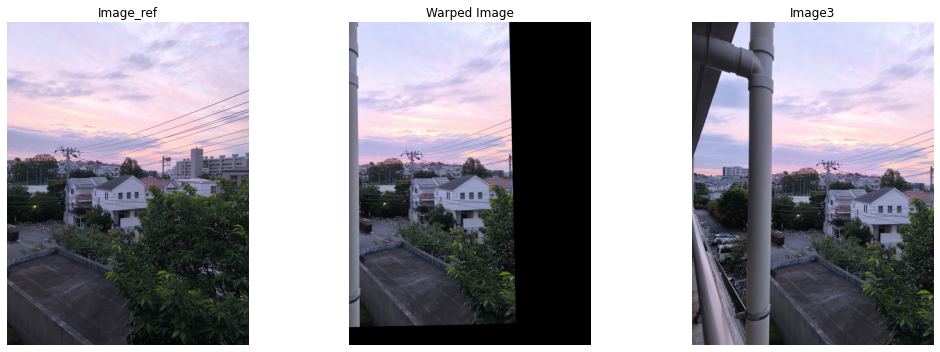

In [120]:
for k in range(len(matrices)):
    image = images[k]
    height, width = image.shape[:2]
    print(matrices[k])
    warped_img = cv2.warpPerspective(image, matrices[k], (width, height))
    warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_ref_color = cv2.cvtColor(img_ref, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(img_ref_color)
    axs[0].axis('off')
    axs[0].set_title("Image_ref")

    axs[1].imshow(warped_img)
    axs[1].axis('off')
    axs[1].set_title("Warped Image")

    axs[2].imshow(image)
    axs[2].axis('off')
    axs[2].set_title("Image"+str(k+2))

    plt.tight_layout()
    plt.show()

In [121]:
print(matrices[0], '\n')
print(matrices[1])

[[ 1.05548842e+00 -2.11027853e-02  1.29465345e+03]
 [ 2.11027853e-02  1.05548842e+00 -1.65422151e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]] 

[[ 9.47415655e-01  2.15516576e-02 -8.74701841e+02]
 [-2.15516576e-02  9.47415655e-01  7.71681682e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


[[  1.           0.         874.70184326]
 [  0.           1.         165.42214966]
 [  0.           0.           1.        ]]


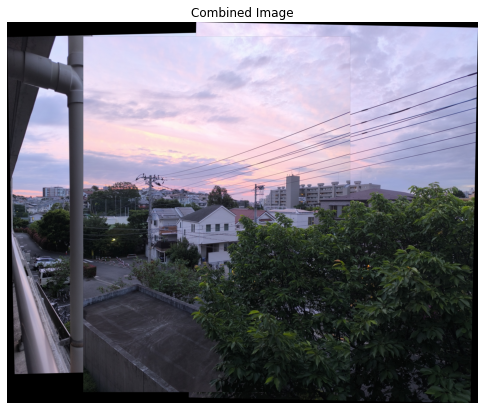

In [122]:
max_x = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
max_y = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

min_x = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
min_y = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

canvas_width, canvas_height = int(max_x-min_x), int(max_y-min_y)

canvas = np.zeros((canvas_width, canvas_height), dtype=np.uint8)

translation_canvas = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]])


warped_img = cv2.warpPerspective(img_ref, translation_canvas, (canvas_width, canvas_height))

canvas = warped_img

print(translation_canvas)

#for k in range(len(matrices)):
for k in range(len(matrices)):
    image = images[k]
    mat = translation_canvas @ matrices[k]
    warped_img = cv2.warpPerspective(image, mat, (canvas_width, canvas_height))
    gray_canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2GRAY)
    
    # Create mask where canvas is black
    mask = np.zeros_like(gray_canvas)
    mask[gray_canvas == 0] = 255
    # Invert mask
    mask_inverse = cv2.bitwise_not(mask)
    
    # Blend picture 2 into picture 1 using the mask
    canvas += cv2.bitwise_and(warped_img, warped_img, mask=mask)
    
    
# Convert the BGR image to RGB
canvas_rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)


# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_rgb)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

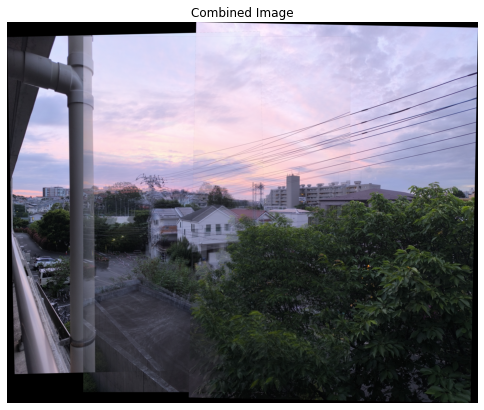

In [123]:
canvas_similarity = create_canvas(new_coordinates, img_ref, matrices)

# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_similarity)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

# Affine


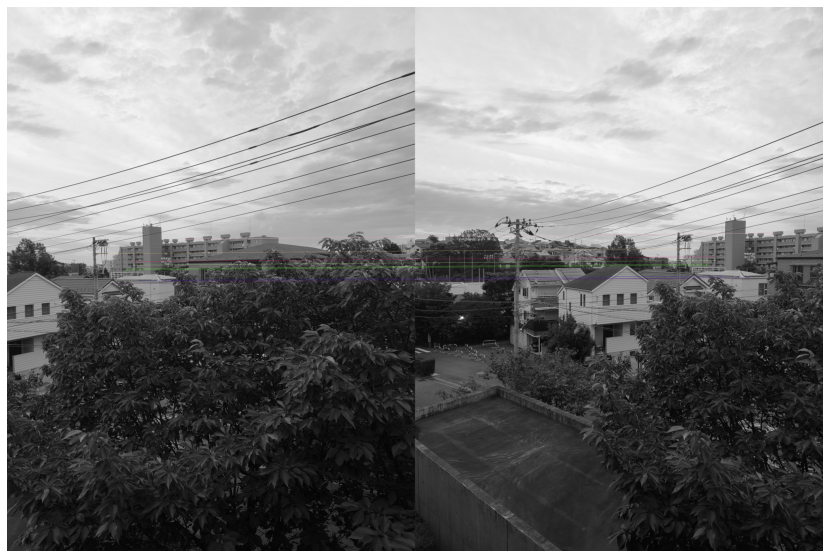

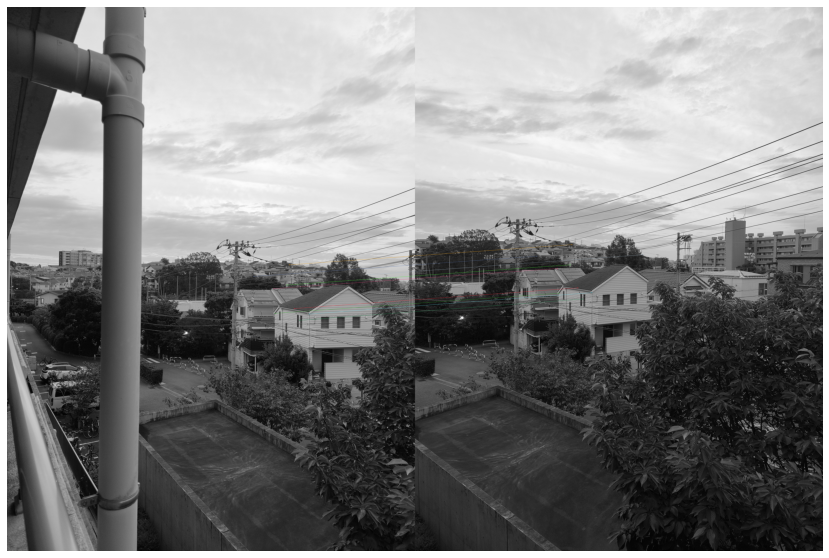

In [124]:
mc = [transform_corner(image_path, imgref_path,'affine') for image_path in images_path]
matrices, new_coordinates = [row[0] for row in mc], [row[1] for row in mc]

height_ref, width_ref = len(img_ref), len(img_ref[0])

new_coordinates.append(np.array([[0, 0], [width_ref, 0], [width_ref, height_ref], [0, height_ref]], dtype=np.float32).reshape(-1, 1, 2))


[[ 1.04621426e+00 -6.03672330e-02  1.37944383e+03]
 [ 8.15778559e-03  1.03464925e+00 -1.12641948e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


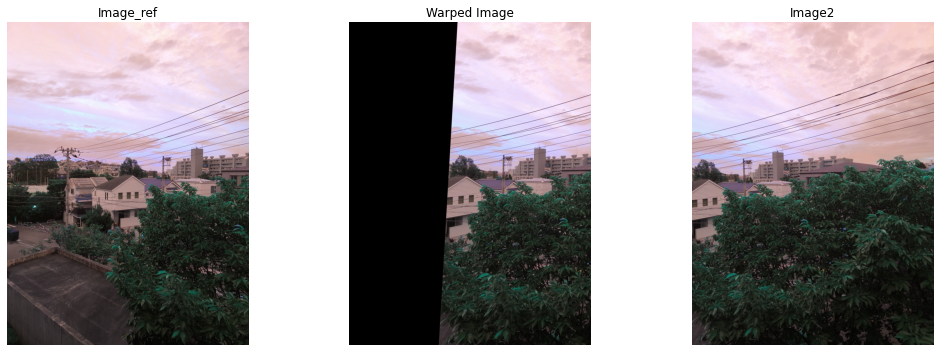

[[ 9.32331324e-01  4.55196968e-02 -8.95440361e+02]
 [-6.94448499e-03  9.80901628e-01 -9.69822227e+01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


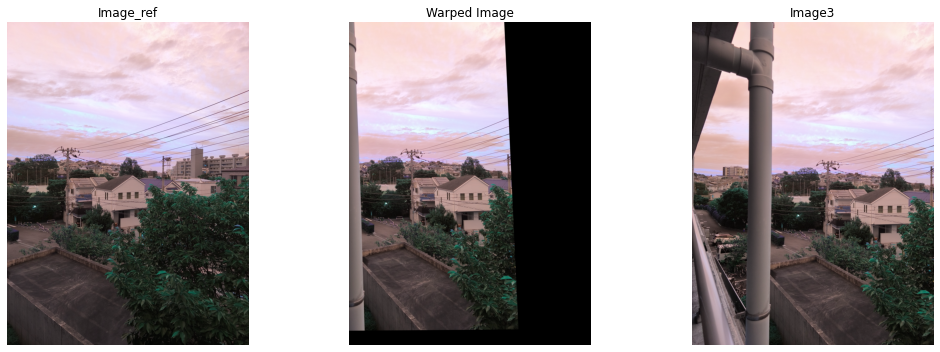

In [125]:
for k in range(len(matrices)):
    image = images[k]
    height, width = image.shape[:2]
    print(matrices[k])
    warped_img = cv2.warpPerspective(image, matrices[k], (width, height))

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(img_ref)
    axs[0].axis('off')
    axs[0].set_title("Image_ref")

    axs[1].imshow(warped_img)
    axs[1].axis('off')
    axs[1].set_title("Warped Image")

    axs[2].imshow(image)
    axs[2].axis('off')
    axs[2].set_title("Image"+str(k+2))

    plt.tight_layout()
    plt.show()

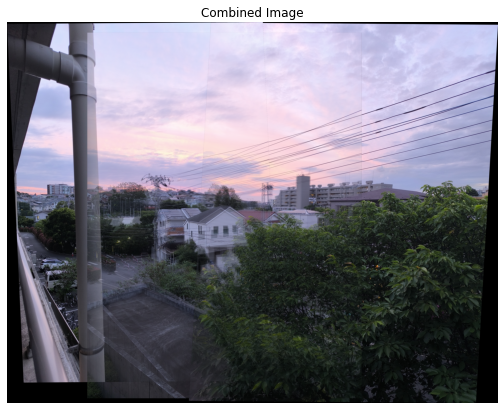

In [126]:
max_x = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
max_y = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

min_x = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
min_y = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

canvas_width, canvas_height = int(max_x-min_x), int(max_y-min_y)

canvas = np.zeros((canvas_height, canvas_width,3), dtype=np.float32)
counter = np.zeros((canvas_height, canvas_width,3), dtype=np.float32)
translation_canvas = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]])


warped_img = cv2.warpPerspective(img_ref, translation_canvas, (canvas_width, canvas_height))

canvas += warped_img.astype(np.float32)
mask = (warped_img > 0).astype(np.float32)
counter += mask

#for k in range(len(matrices)):
for k in range(len(matrices)):
    image = images[k]
    mat = translation_canvas @ matrices[k]
    warped_img = cv2.warpPerspective(image, mat, (canvas_width, canvas_height))
    mask = (warped_img > 0).astype(np.float32)
    canvas += warped_img.astype(np.float32)
    counter += mask
    # gray_canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2GRAY)
    # 
    # # Create mask where canvas is black
    # mask = np.zeros_like(gray_canvas)
    # mask[gray_canvas == 0] = 255
    # # Invert mask
    # mask_inverse = cv2.bitwise_not(mask)
    # 
    # # Blend picture 2 into picture 1 using the mask
    # canvas += cv2.bitwise_and(warped_img, warped_img, mask=mask)
    
    
# Convert the BGR image to RGB
canvas =  np.divide(canvas, counter, out=np.zeros_like(canvas), where=counter != 0).astype(np.uint8)
canvas_rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)


# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_rgb)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

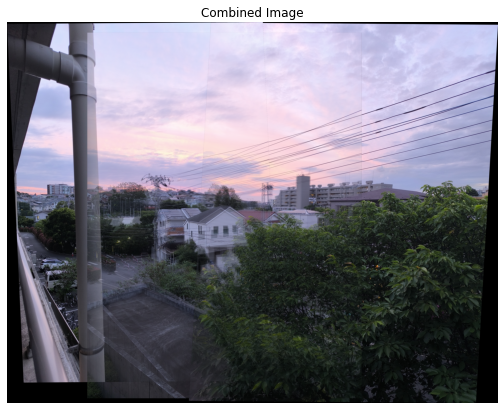

In [127]:
canvas_affine = create_canvas(new_coordinates, img_ref, matrices)

# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_affine)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

# Homography

In [128]:
def homography_matrice(image1_path, image2_path):
    
    kp1, kp2, matches = match_images(image1_path, image2_path)
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches])
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches])

    H, mask = cv2.findHomography(src_pts, dst_pts)
    
    image1 = cv2.imread(image1_path)
    

    height, width = len(image1), len(image1[0])
    corners = np.array([[0, 0], [width, 0], [width, height], [0, height]], dtype=np.float32).reshape(-1, 1, 2)
    transformed_corners = cv2.perspectiveTransform(corners, H)
    return H, transformed_corners

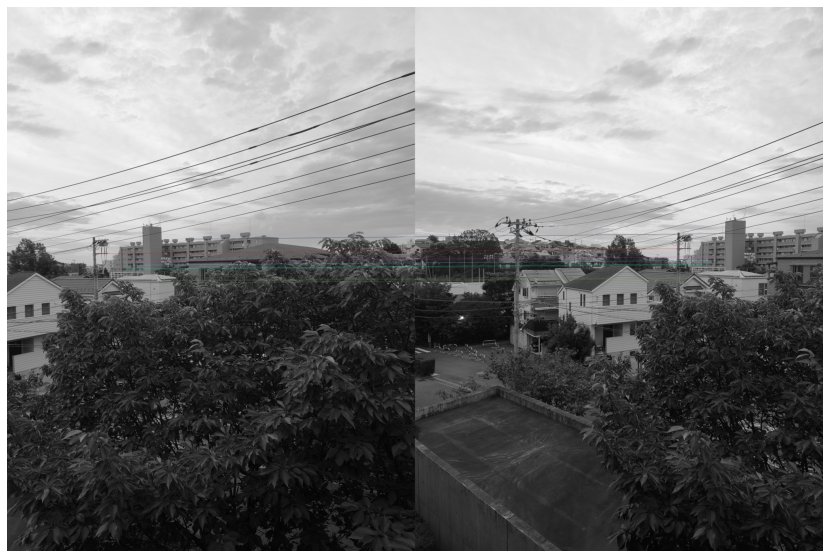

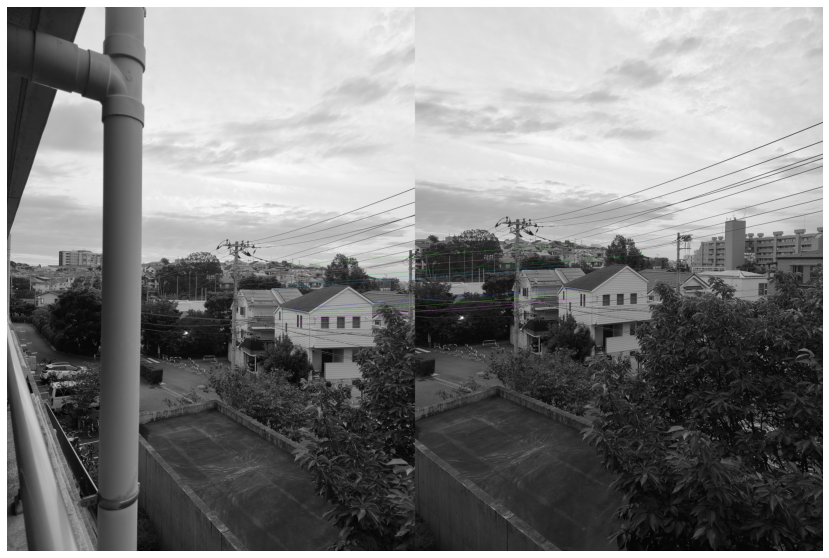

In [129]:
mc = [homography_matrice(image_path, imgref_path) for image_path in images_path]
matrices, new_coordinates = [row[0] for row in mc], [row[1] for row in mc]

height_ref, width_ref = len(img_ref), len(img_ref[0])

new_coordinates.append(np.array([[0, 0], [width_ref, 0], [width_ref, height_ref], [0, height_ref]], dtype=np.float32).reshape(-1, 1, 2))

[[ 3.56228307e-01 -6.75523368e-02  1.52126212e+03]
 [-3.42935239e-01  7.30063734e-01  3.75314278e+02]
 [-1.89540420e-04 -2.59126979e-05  1.00000000e+00]]


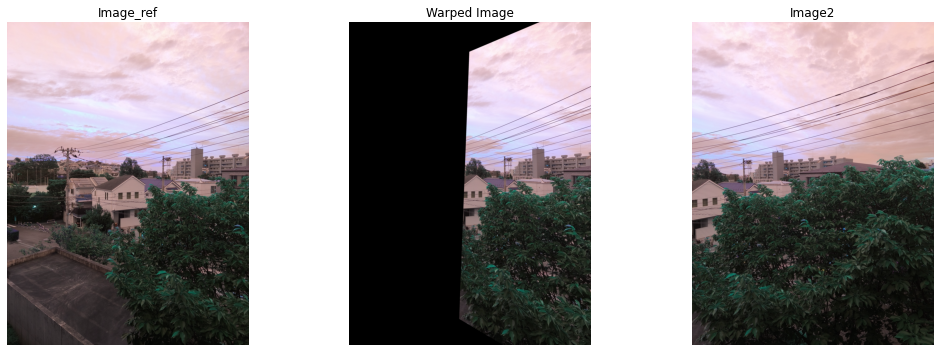

[[ 1.65498044e+00  5.92585781e-02 -1.89064603e+03]
 [ 3.62141508e-01  1.51117350e+00 -1.07447087e+03]
 [ 1.94243657e-04  2.85996241e-05  1.00000000e+00]]


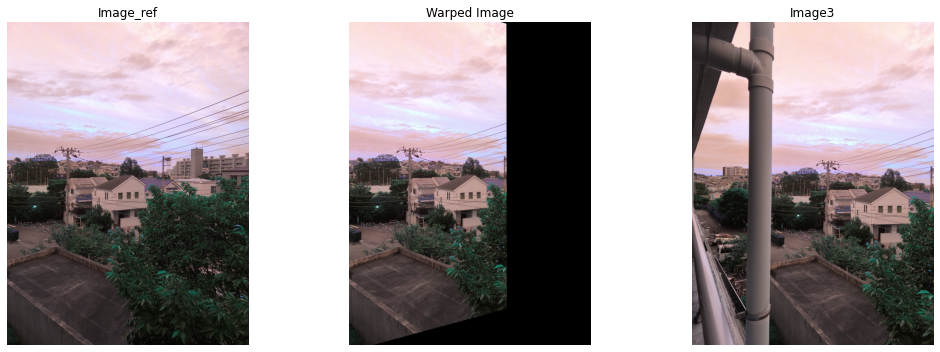

In [130]:
for k in range(len(matrices)):
    image = images[k]
    height, width = image.shape[:2]
    print(matrices[k])
    warped_img = cv2.warpPerspective(image, matrices[k], (width, height))

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(img_ref)
    axs[0].axis('off')
    axs[0].set_title("Image_ref")

    axs[1].imshow(warped_img)
    axs[1].axis('off')
    axs[1].set_title("Warped Image")

    axs[2].imshow(image)
    axs[2].axis('off')
    axs[2].set_title("Image"+str(k+2))

    plt.tight_layout()
    plt.show()

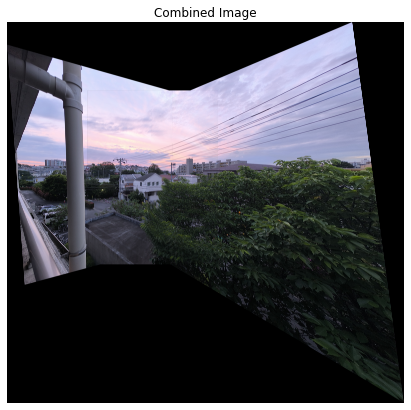

In [131]:
max_x = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
max_y = np.max(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

min_x = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 0])
min_y = np.min(np.concatenate(new_coordinates, axis=0)[:, 0, 1])

canvas_width, canvas_height = int(max_x-min_x), int(max_y-min_y)

canvas = np.zeros((canvas_height, canvas_width,3), dtype=np.float32)
counter = np.zeros((canvas_height, canvas_width,3), dtype=np.float32)
translation_canvas = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]])


warped_img = cv2.warpPerspective(img_ref, translation_canvas, (canvas_width, canvas_height))

canvas += warped_img.astype(np.float32)
mask = (warped_img > 0).astype(np.float32)
counter += mask

#for k in range(len(matrices)):
for k in range(len(matrices)):
    image = images[k]
    mat = translation_canvas @ matrices[k]
    warped_img = cv2.warpPerspective(image, mat, (canvas_width, canvas_height))
    mask = (warped_img > 0).astype(np.float32)
    canvas += warped_img.astype(np.float32)
    counter += mask
    
    
# Convert the BGR image to RGB
canvas =  np.divide(canvas, counter, out=np.zeros_like(canvas), where=counter != 0).astype(np.uint8)
canvas_rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
warped_img = cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB)


# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_rgb)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

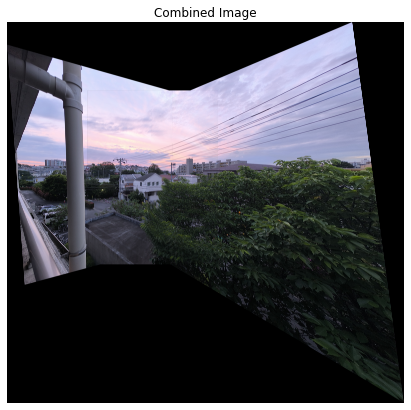

In [132]:
canvas_homography = create_canvas(new_coordinates, img_ref, matrices)

# Display the result using matplotlib
plt.figure(figsize=(40, 7))
plt.imshow(canvas_homography)
plt.axis('off')  # Hide the axis
plt.title('Combined Image')
plt.show()

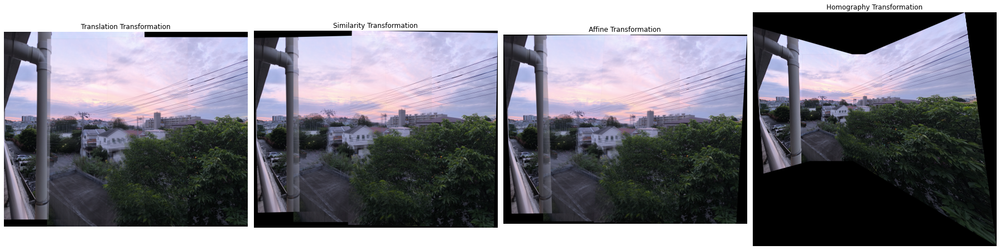

In [133]:
fig, axs = plt.subplots(1, 4, figsize=(25, 10))

axs[0].imshow(canvas_translation)
axs[0].axis('off')
axs[0].set_title("Translation Transformation")

axs[1].imshow(canvas_similarity)
axs[1].axis('off')
axs[1].set_title("Similarity Transformation")

axs[2].imshow(canvas_affine)
axs[2].axis('off')
axs[2].set_title("Affine Transformation")

axs[3].imshow(canvas_homography)
axs[3].axis('off')
axs[3].set_title("Homography Transformation")


plt.tight_layout()
plt.show()